<img src='https://gitlab.eumetsat.int/eumetlab/oceans/ocean-training/tools/frameworks/-/raw/main/img/Standard_banner.png' align='right' width='100%'/>

# <font color="#d42b2b">**_LOS ANGELES WILDFIRE_**</font> <br>

<html>
  <div style="width:100%">
    <div style="float:left"><a href="https://jupyterhub-wekeo.apps.eumetsat.dpi.wekeo.eu/hub/user-redirect/lab/tree/public/wekeo4oceans/learn-olci/1_OLCI_introductory/1_4_OLCI_bands_imagery.ipynb"><img src="https://img.shields.io/badge/launch-WEKEO-1a4696.svg?style=flat&logo=" alt="Open in WEkEO"></a></div>
    <div style="float:left"><p>&emsp;</p></div>
  </div>  
</html>

***

<center>
 <h1>Current Emergency Incidents 
in the LA Wildfire </h1>
</center>

<table style="width:80%; font-size:22px;">
  <tr>
    <th>Total Emergency Responses</th>
    <th>Wildfires</th>
    <th>Acres Burned</th>
    <th>Structures Destroyed</th>
      <th>Deaths</th>
  </tr>
  <tr>
    <td>37,794</td>
    <td>255</td>
    <td>50,684</td>
    <td>16,188</td>
      <td>29</td>
  </tr>
</table>


***

## The Table Shows the current emergency incidents of the Los Angeles wildfire.
### There have been<u> 37.794 emergency responses</u>. A total of <u>255 wildfires</u> have burned <u>50.684 acres</u> so far. <u>16.188 structures</u> have been destroyed and <u>29</u> people died. The Firefighters and emergency teams are doing their best to try to control the fire.

***

## How did the wildfire start?


### The Los Angeles wildfires were caused by a mix of dry weather, strong winds and low humidty. One fire may have started from New Year's fireworks and another possibly by broken power lines. The real cause of the fire is still unknown.

***

## When did the wildfire start?

### The Los Angeles wildfires started in early January just after New Year's. Depending on the location the biggest fires started around the 6-7 January.

***

## Who started the wildfire?

### The cause of the 2025 Los Angeles wildfire is still unknown and under investigation.

---

<center>
_____________________________________________________________________________________________________________________________________________________________________________________________________________________<h1>Looking up Satellite Images of the Wildfire
</h1>________________________________________________________________________________________________________________________________________________________________________________________________________________<center>

## <center> Sentinel 3 OLCI </center>

---

<div class="alert alert-info" role="alert">

### 1. _Required libraries:_
__[Back to top](#TOC_TOP)__

</div>

***

### <font color="#3ecaea">**Imports**</font> <br>

In [36]:
import os
import sys
import json
import time
import base64
from IPython.core.display import HTML

import requests
import warnings
import matplotlib.pyplot as plt 
from matplotlib.patches import Circle
warnings.filterwarnings('ignore')

### <font color="#3ecaea">**Load WEkEO HDA Client**</font> <br>

In [25]:
import hda

***

<div class="alert alert-box alert-warning">

### _2. Dataset:_
__[Back to top](#TOC_TOP)__

<div>

***

### <font color="#feaf1e">**Dataset ID**</font> <br>

In [51]:
dataset_id ="EO:EUM:DAT:SENTINEL-3:OL_1_EFR___"

### <font color="#feaf1e">**Start HDA Cliet**</font> <br>

In [52]:
c = hda.Client()

### <font color="#feaf1e">**Request Data**</font> <br>

In [18]:
query = {
  "dataset_id": "EO:EUM:DAT:SENTINEL-3:OL_1_EFR___",
  "publication": "2021-12-20T09:47:09.915Z",
  "startdate": "2025-01-10T00:00:00.000Z",
  "enddate": "2025-01-10T23:59:59.999Z",
  "bbox": [
    -119.10525408012728,
    32.30379405827816,
    -116.74108503559052,
    34.764373598046426
  ],
  "itemsPerPage": 200,
  "startIndex": 0
}

***

<div class="alert alert-block alert-success">

### _3. Items and Downlaod:_
__[Back to top](#TOC_TOP)__
</div>

***

### <font color="#16da3d">**Download**</font> <br>

In [ ]:
matches = c.search(query)
matches.download()

### <font color="#16da3d">**Items**</font> <br>

In [ ]:
matches

***

<div class="alert alert-block alert-danger">

### _4. Extracting File and Import:_
__[Back to top](#TOC_TOP)__
</div>

***

### <font color= "#df0000"> **Extract File**</font> <br>

In [26]:
import zipfile
import os
 
# Path to the zip file and extraction directory
zip_file_path = "/home/jovyan/S3B_OL_1_EFR____20250110T175832_20250110T180132_20250111T205534_0180_102_041_2340_MAR_O_NT_004.SEN3.zip"
extract_to_path = "/home/jovyan/Data"
 
# Ensure the extraction directory exists
os.makedirs(extract_to_path, exist_ok=True)
 
# Open and extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)
 
print(f"Files extracted to: {extract_to_path}")

Files extracted to: /home/jovyan/Data


In [13]:
os.getcwd()

'/home/jovyan'

### <font color= "#df0000"> **Imports**</font> <br>

In [27]:
import cartopy.crs as ccrs
import glob
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import os
import warnings
import xarray as xr
import eumartools
warnings.filterwarnings('ignore')

### <font color= "#df0000"> **Reading Data**</font> <br>

In [28]:
SAFE_directory = os.path.join(os.getcwd(), 'Data', 
    'S3B_OL_1_EFR____20250110T175832_20250110T180132_20250111T205534_0180_102_041_2340_MAR_O_NT_004.SEN3')

In [29]:
grid_reduce = 3
band_vars = xr.open_mfdataset(glob.glob(os.path.join(SAFE_directory,'Oa*.nc')))
band_dict = {}
bands_needed = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 17]

for band_var in band_vars:
    band_num = int(band_var.split('_')[0][2:])
    if band_num not in bands_needed:
        print(f"Skipping: {band_var}, as we don't need it for now")
    else:
        print(f"Reading:  {band_var}")
        band_dict[band_var] = band_vars[band_var].data[::grid_reduce,::grid_reduce]

band_vars.close()

Reading:  Oa01_radiance
Reading:  Oa01_radiance_unc
Reading:  Oa02_radiance
Reading:  Oa02_radiance_unc
Reading:  Oa03_radiance
Reading:  Oa03_radiance_unc
Reading:  Oa04_radiance
Reading:  Oa04_radiance_unc
Reading:  Oa05_radiance
Reading:  Oa05_radiance_unc
Reading:  Oa06_radiance
Reading:  Oa06_radiance_unc
Reading:  Oa07_radiance
Reading:  Oa07_radiance_unc
Reading:  Oa08_radiance
Reading:  Oa08_radiance_unc
Reading:  Oa09_radiance
Reading:  Oa09_radiance_unc
Reading:  Oa10_radiance
Reading:  Oa10_radiance_unc
Reading:  Oa11_radiance
Reading:  Oa11_radiance_unc
Skipping: Oa12_radiance, as we don't need it for now
Skipping: Oa12_radiance_unc, as we don't need it for now
Skipping: Oa13_radiance, as we don't need it for now
Skipping: Oa13_radiance_unc, as we don't need it for now
Skipping: Oa14_radiance, as we don't need it for now
Skipping: Oa14_radiance_unc, as we don't need it for now
Skipping: Oa15_radiance, as we don't need it for now
Skipping: Oa15_radiance_unc, as we don't need

***

<div class="alert alert-info" role="alert">

### _5. Colour Correction:_
__[Back to top](#TOC_TOP)__

***

### <font color= "#3ecaea"> **Create RGB**</font> <br>

In [30]:
# Tristimulus
red_recipe = np.log10(1.0 + 0.01 * band_dict['Oa01_radiance'] + 0.09 * band_dict['Oa02_radiance'] 
                      + 0.35 * band_dict['Oa03_radiance'] + 0.04 * band_dict['Oa04_radiance'] 
                      + 0.01 * band_dict['Oa05_radiance'] + 0.59 * band_dict['Oa06_radiance'] 
                      + 0.85 * band_dict['Oa07_radiance'] + 0.12 * band_dict['Oa08_radiance'] 
                      + 0.07 * band_dict['Oa09_radiance'] + 0.04 * band_dict['Oa10_radiance'])
green_recipe = np.log10(1.0 + 0.26 * band_dict['Oa03_radiance'] + 0.21 * band_dict['Oa04_radiance'] 
                        + 0.50 * band_dict['Oa05_radiance'] + band_dict['Oa06_radiance'] 
                        + 0.38 * band_dict['Oa07_radiance'] + 0.04 * band_dict['Oa08_radiance'] 
                        + 0.03 * band_dict['Oa09_radiance'] + 0.02 * band_dict['Oa10_radiance'])
blue_recipe = np.log10(1.0 + 0.07 * band_dict['Oa01_radiance'] + 0.28 * band_dict['Oa02_radiance'] 
                       + 1.77 * band_dict['Oa03_radiance'] + 0.47 * band_dict['Oa04_radiance'] 
                       + 0.16 * band_dict['Oa05_radiance'])

rgb_tri = np.dstack((red_recipe, green_recipe, blue_recipe))
rgb_tri_norm = eumartools.normalise_image(rgb_tri)

In [32]:
# Natural colour broad band, log scaled
red_recipe = 0.16666 * band_dict['Oa09_radiance'] + 0.66666 * band_dict['Oa09_radiance'] \
             + 0.08333 * band_dict['Oa10_radiance'] + 0.08333 * band_dict['Oa11_radiance']
green_recipe = 0.16666 *  band_dict['Oa05_radiance'] + 0.66666 *  band_dict['Oa06_radiance'] \
               + 0.16666 *  band_dict['Oa07_radiance']
blue_recipe = 0.16666 *  band_dict['Oa02_radiance'] + 0.66666 *  band_dict['Oa03_radiance'] \
               + 0.16666 *  band_dict['Oa04_radiance']

rgb_log = np.dstack(((np.log10(red_recipe * 0.01) + 1.6516951369518393) / 1.9887713527138795,
                    (np.log10(green_recipe * 0.01) + 1.6516951369518393) / 1.9887713527138795,
                    (np.log10(blue_recipe * 0.01) + 1.6516951369518393) / 1.9887713527138795))
                     
rgb_log_norm = eumartools.normalise_image(rgb_log)

### <font color= "#3ecaea"> **Improving RGB's**</font> <br>

In [33]:
rgb_log_norm_unhitch = eumartools.normalise_image(rgb_log, unhitch=True)
rgb_log_norm_trunc = eumartools.truncate_image(rgb_log_norm, min_percentile=5.0, max_percentile=95.0)
rgb_log_norm_hist = eumartools.histogram_image(rgb_log_norm, nbins=512)

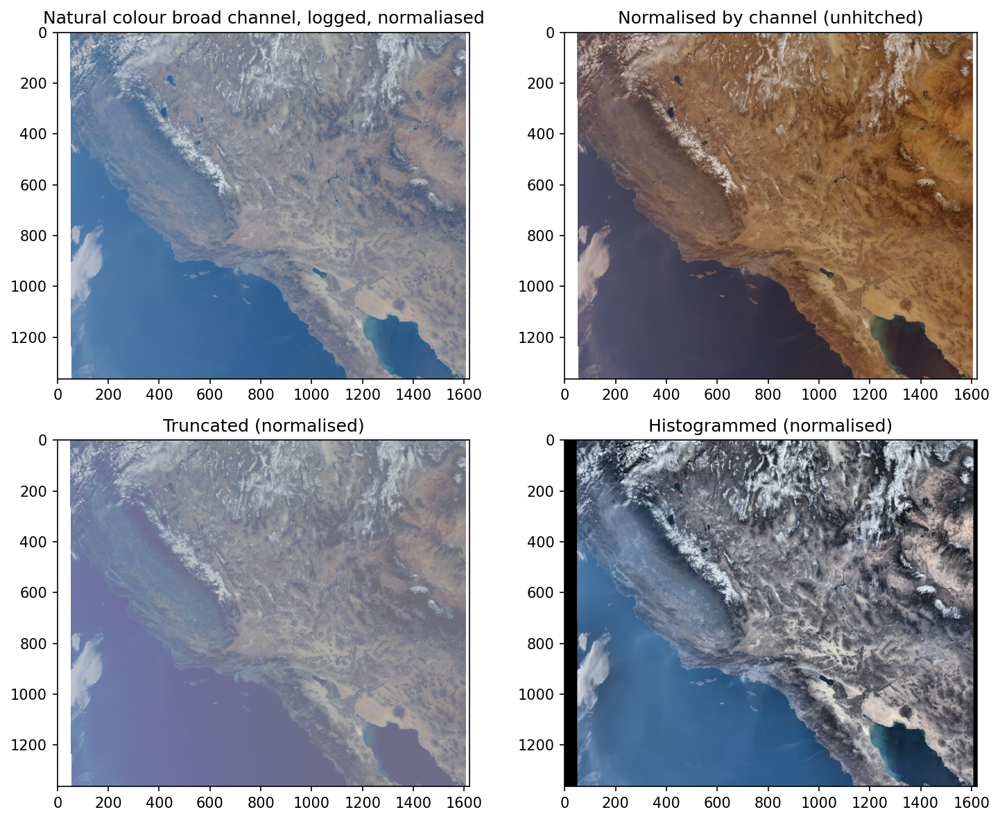

In [39]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=150)

axs[0,0].imshow(rgb_log_norm); axs[0,0].title.set_text('Natural colour broad channel, logged, normaliased')
axs[0,1].imshow(rgb_log_norm_unhitch); axs[0,1].title.set_text('Normalised by channel (unhitched)')
axs[1,0].imshow(rgb_log_norm_trunc); axs[1,0].title.set_text('Truncated (normalised)')
axs[1,1].imshow(rgb_log_norm_hist); axs[1,1].title.set_text('Histogrammed (normalised)')

plt.tight_layout()



***

<center>
 ____________________________________________________________<h1>Create a Geographical Map</h1>____________________________________________________________
</center>

## Reading Data

In [40]:
geo_file = os.path.join(SAFE_directory,'geo_coordinates.nc')
geo_vars = xr.open_dataset(geo_file)
lon = geo_vars.longitude.data[::grid_reduce,::grid_reduce]
lat = geo_vars.latitude.data[::grid_reduce,::grid_reduce]
geo_vars.close()

## Results (Creates the Map)

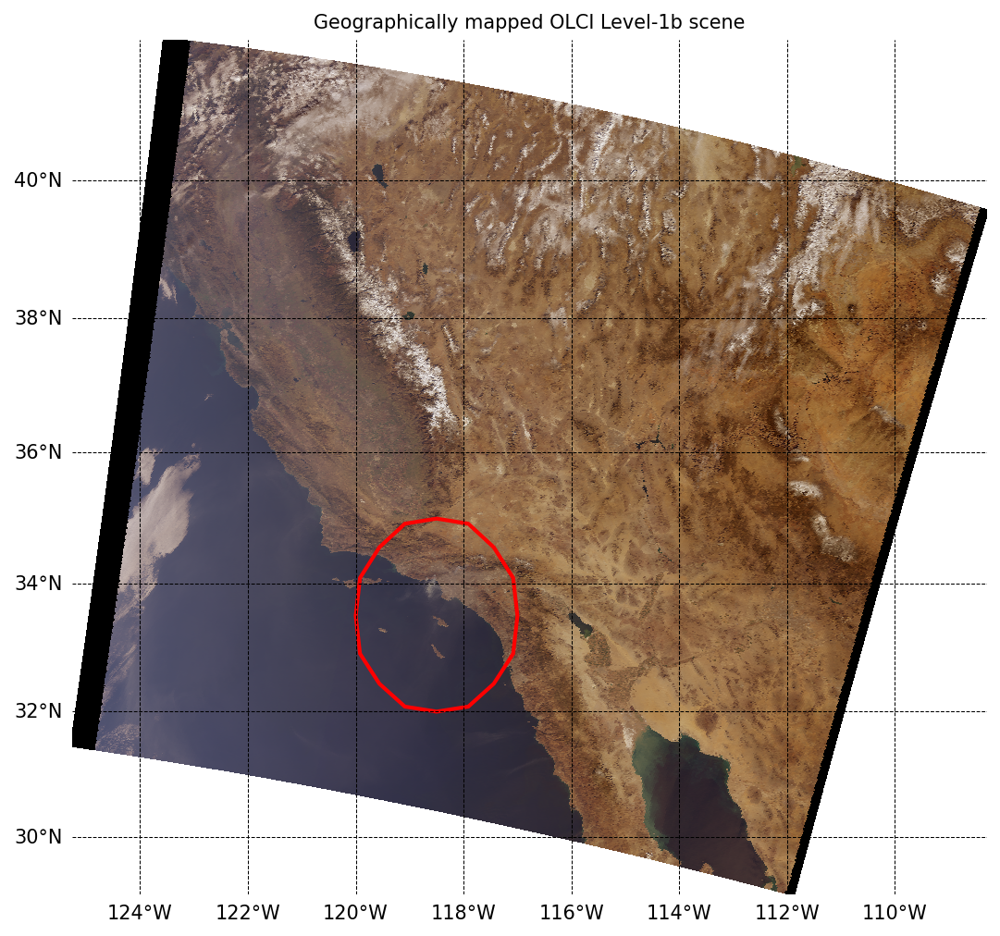

In [44]:
fig = plt.figure(figsize=(10, 8), dpi=150)
m = plt.subplot(projection=ccrs.Mercator())

# make the colour map
colorArray = np.array(rgb_log_norm_unhitch)
colorTuple = colorArray.reshape((colorArray.shape[0] * colorArray.shape[1]), 3)
colorTuple = np.insert(colorTuple, 3, 1.0, axis=1)

# make the map
m.pcolormesh(lon, lat, lon, color=colorTuple, edgecolors=None, transform=ccrs.PlateCarree())

# Embellish with gridlines
g1 = m.gridlines(draw_labels = True, zorder=20, color='k', linestyle='--',linewidth=0.5)
g1.xlocator = mticker.FixedLocator(np.arange(-180, 180, 2))
g1.ylocator = mticker.FixedLocator(np.arange(-90, 90, 2))
g1.top_labels = False
g1.right_labels = False
g1.xlabel_style = {'size': 10, 'color': 'black'}
g1.ylabel_style = {'size': 10, 'color': 'black'}
m.set(facecolor = "1.0")
m.axis('off')
# Kreis hinzufügen (transformiert auf die geografischen Koordinaten)
kreis = Circle(
    (-118.5, 33.5), radius=1.5, linewidth=2, fill=False, transform=ccrs.PlateCarree(),color="red"
)
m.add_patch(kreis)
plt.title('Geographically mapped OLCI Level-1b scene', fontsize=10)
plt.savefig('1_4_OLCI_RGB.png', bbox_inches='tight')
plt.show()


---

<center>
 ____________________________________________________________<h1>Fire Radiative Power Map</h1>____________________________________________________________
</center>

## <center> Sentinel 3 SLSTR </center>

---

## Imports

In [2]:
import xarray as xr
import numpy as np
import hda

import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.cm as cm
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

## Dataset

In [20]:
dataset_id ="EO:EUM:DAT:SENTINEL-3:0417"

## Start HDA Client

In [21]:
c = hda.Client()

## Request Data

In [105]:
query = {
  "dataset_id": "EO:EUM:DAT:SENTINEL-3:0417",
  "publication": "2021-12-20T09:47:09.915Z",
  "startdate": "2025-01-07T00:00:00.000Z",
  "enddate": "2025-01-14T00:00:00.000Z",
  "bbox": [
    -122.80390619,
    29.82154760,
    -114.36531210,
    29.82154760
  ],
  "itemsPerPage": 200,
  "startIndex": 0
}

## Download

In [108]:
matches = c.search(query)
matches.download()

 24%|██▍       | 3.15M/13.1M [00:00<00:00, 18.8MB/s]
                                                    
%|▏         | 236k/12.6M [00:00<00:05, 2.42MB/s]
%|██▍       | 3.06M/12.6M [00:00<00:00, 18.5MB/s]
  9%|▊         | 1.01M/11.5M [00:00<00:01, 10.5MB/s]
 17%|█▋        | 2.01M/11.5M [00:00<00:00, 10.3MB/s]
 47%|████▋     | 5.45M/11.5M [00:00<00:00, 22.0MB/s]
                                                    
                                                    
%|          | 0.00/12.7M [00:00<?, ?B/s]
%|████▌     | 5.78M/12.7M [00:00<00:00, 60.4MB/s]
  0%|          | 0.00/11.3M [00:00<?, ?B/s]         
 18%|█▊        | 2.07M/11.3M [00:00<00:00, 21.7MB/s]
 41%|████▏     | 4.70M/11.3M [00:00<00:00, 25.2MB/s]
 68%|██████▊   | 7.70M/11.3M [00:00<00:00, 28.0MB/s]
 16%|█▌        | 1.98M/12.7M [00:00<00:01, 6.52MB/s]
                                                    
%|▎         | 428k/12.5M [00:00<00:07, 1.75MB/s]
%|███       | 3.80M/12.5M [00:00<00:00, 14.0MB/s]
                      

## Items

In [107]:
matches

SearchResults[items=12,volume=143MB]

## Helper Functions

In [3]:
def generate_masked_array(xarray, mask, threshold, operator, drop=True):
    """ 
    Applies a mask (e.g. a cloud mask) onto a given xarray.DataArray, based on a given threshold and operator.
    
    Parameters:
        xarray(xarray DataArray): a three-dimensional xarray.DataArray object
        mask(xarray DataArray): 1-dimensional xarray.DataArray, e.g. cloud fraction values
        threshold(float): any number specifying the threshold
        operator(str): operator how to mask the array, e.g. '<', '>' or '!='
        drop(boolean): default is True
        
    Returns:
        Masked xarray.DataArray with NaN values dropped, if kwarg drop equals True
    """
    if(operator=='<'):
        cloud_mask = xr.where(mask < threshold, 1, 0) #Generate cloud mask with value 1 for the pixels we want to keep
    elif(operator=='!='):
        cloud_mask = xr.where(mask != threshold, 1, 0)
    elif(operator=='>'):
        cloud_mask = xr.where(mask > threshold, 1, 0)
    else:
        cloud_mask = xr.where(mask == threshold, 1, 0)
            
    xarray_masked = xr.where(cloud_mask ==1, xarray, np.nan) #Apply mask onto the DataArray
    xarray_masked.attrs = xarray.attrs #Set DataArray attributes 
    if(drop):
        return xarray_masked[~np.isnan(xarray_masked)] #Return masked DataArray
    else:
        return xarray_masked

In [4]:
def slstr_frp_gridding(parameter_array, parameter, lat_min, lat_max, lon_min, lon_max, 
                       sampling_lat_FRP_grid, sampling_lon_FRP_grid, n_fire, lat_frp, lon_frp, **kwargs):
    """ 
    Produces gridded data of Sentinel-3 SLSTR NRT Fire Radiative Power Data
    
    Parameters:
        parameter_array(xarray.DataArray): xarray.DataArray with extracted data variable of fire occurences
        parameter(str): NRT S3 FRP channel - either `mwir`, `swir` or `swir_nosaa`
        lat_min, lat_max, lon_min, lon_max(float): Floats of geographical bounding box
        sampling_lat_FRP_grid, sampling_long_FRP_grid(float): Float of grid cell size
        n_fire(int): Number of fire occurences
        lat_frp(xarray.DataArray): Latitude values of occurred fire events
        lon_frp(xarray.DataArray): Longitude values of occurred fire events
        **kwargs: additional keyword arguments to be added. Required for parameter `swir_nosaa`, where the function
                  requires the xarray.DataArray with the SAA FLAG information.  

    Returns:
        the gridded xarray.Data Array and latitude and longitude grid information
    """ 
    n_lat = int( (np.float32(lat_max) - np.float32(lat_min)) / sampling_lat_FRP_grid ) + 1 # Number of rows per latitude sampling
    n_lon = int( (np.float32(lon_max) - np.float32(lon_min)) / sampling_lon_FRP_grid ) + 1 # Number of lines per longitude sampling

    
    slstr_frp_gridded = np.zeros( [n_lat, n_lon], dtype='float32' ) - 9999.

    lat_grid = np.zeros( [n_lat, n_lon], dtype='float32' ) - 9999.
    lon_grid = np.zeros( [n_lat, n_lon], dtype='float32' ) - 9999.
    
    if (n_fire >= 0):
    
    # Loop on i_lat: begins
        for i_lat in range(n_lat):
                    
        # Loop on i_lon: begins
            for i_lon in range(n_lon):
                        
                lat_grid[i_lat, i_lon] = lat_min + np.float32(i_lat) * sampling_lat_FRP_grid + sampling_lat_FRP_grid / 2.
                lon_grid[i_lat, i_lon] = lon_min + np.float32(i_lon) * sampling_lon_FRP_grid + sampling_lon_FRP_grid / 2.
                            
            # Gridded SLSTR FRP MWIR Night - All days
                if(parameter=='swir_nosaa'):
                    FLAG_FRP_SWIR_SAA_nc = kwargs.get('flag', None)
                    mask_grid = np.where( 
                        (lat_frp[:] >= lat_min + np.float32(i_lat) * sampling_lat_FRP_grid)  & 
                        (lat_frp[:] < lat_min + np.float32(i_lat+1) * sampling_lat_FRP_grid) & 
                        (lon_frp[:] >= lon_min + np.float32(i_lon) * sampling_lon_FRP_grid)  & 
                        (lon_frp[:] < lon_min + np.float32(i_lon+1) * sampling_lon_FRP_grid) &
                        (parameter_array[:] != -1.) & (FLAG_FRP_SWIR_SAA_nc[:] == 0), False, True)
                else:
                    mask_grid = np.where( 
                        (lat_frp[:] >= lat_min + np.float32(i_lat) * sampling_lat_FRP_grid)  & 
                        (lat_frp[:] < lat_min + np.float32(i_lat+1) * sampling_lat_FRP_grid) & 
                        (lon_frp[:] >= lon_min + np.float32(i_lon) * sampling_lon_FRP_grid)  & 
                        (lon_frp[:] < lon_min + np.float32(i_lon+1) * sampling_lon_FRP_grid) &
                        (parameter_array[:] != -1.),  False, True)
                            
                masked_slstr_frp_grid = np.ma.array(parameter_array[:], mask=mask_grid)
                            
                if len(masked_slstr_frp_grid.compressed()) != 0:
                    slstr_frp_gridded[i_lat, i_lon]  = np.sum(masked_slstr_frp_grid.compressed())
    return slstr_frp_gridded, lat_grid, lon_grid

In [19]:
def visualize_s3_frp(data, lat, lon, unit, longname, textstr_1, textstr_2, vmax):
    """ 
    Visualizes a numpy.Array (Sentinel-3 SLSTR NRT FRP data) with matplotlib's pcolormesh function and adds two
    text boxes to the plot.
    
    Parameters:
        data(numpy.MaskedArray): any numpy MaskedArray, e.g. loaded with the NetCDF library and the Dataset function
        lat(numpy.Array): array with longitude values
        lon(numpy.Array) : array with latitude values
        unit(str): unit of the resulting plot
        longname(str): Longname to be used as title
        textstr_1(str): String to fill box 1
        textstr_2(str): String to fill box 2
        vmax(float): Maximum value of color scale
    """
    fig=plt.figure(figsize=(20, 15))

    ax = plt.axes(projection=ccrs.PlateCarree())

    
    ax.add_feature(cfeature.NaturalEarthFeature(
        'physical', 'land', '10m', edgecolor='face', facecolor='wheat'))
    ax.add_feature(cfeature.NaturalEarthFeature(
        'physical', 'ocean', '10m', edgecolor='face', facecolor='aliceblue'))
    img = plt.pcolormesh(lon, lat, data, 
                        cmap=cm.autumn_r, transform=ccrs.PlateCarree(),
                        vmin=0,
                        vmax=vmax, zorder=3)

    ax.add_feature(cfeature.BORDERS, edgecolor='black', linewidth=1)
    ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=1)

    gl = ax.gridlines(draw_labels=True, linestyle='--')
    gl.bottom_labels=False
    gl.right_labels=False
    gl.xformatter=LONGITUDE_FORMATTER
    gl.yformatter=LATITUDE_FORMATTER
    gl.xlabel_style={'size':14}
    gl.ylabel_style={'size':14}

    cbar = fig.colorbar(img, ax=ax, orientation='horizontal', fraction=0.029, pad=0.025)
    cbar.set_label(unit, fontsize=16)
    cbar.ax.tick_params(labelsize=14)
    ax.set_title(longname, fontsize=20, pad=40.0) 

    props = dict(boxstyle='square', facecolor='white', alpha=0.5)

    # place a text box on the right side of the plot
    ax.text(1.1, 0.9, textstr_1, transform=ax.transAxes, fontsize=16,
        verticalalignment='top', bbox=props)

    props = dict(boxstyle='square', facecolor='white', alpha=0.5)

    # place a text box in upper left in axes coords
    ax.text(1.1, 0.85, textstr_2, transform=ax.transAxes, fontsize=16,
            verticalalignment='top', bbox=props)
    # **Plot Los Angeles on the map**
    la_lat = 34.0549      # Coordinates for Los Angeles
    la_lon = -118.2426
    ax.plot(la_lon, la_lat, marker='o', markersize=10, color='black', 
            transform=ccrs.PlateCarree(), label="Los Angeles")
     # Optionally add a label
    ax.text(la_lon + 0.1, la_lat, "Los Angeles", color='black', fontsize=16, transform=ccrs.PlateCarree())
    plt.show()
    

In [18]:
def save_s3_frp_plot(data, lat, lon, unit, longname, vmax, filename):
    """ 
    Visualizes a numpy.Array (Sentinel-3 SLSTR NRT FRP data) with matplotlib's pcolormesh function and adds two
    text boxes to the plot. Saves the plot in the background without displaying it.
    
    Parameters:
        data(numpy.MaskedArray): any numpy MaskedArray, e.g. loaded with the NetCDF library and the Dataset function
        lat(numpy.Array): array with latitude values
        lon(numpy.Array) : array with longitude values
        unit(str): unit of the resulting plot
        longname(str): Longname to be used as title
        vmax(float): Maximum value of color scale
        filename(str): Path to save the plot image file (e.g., 'output_plot.png')
    """
    fig = plt.figure(figsize=(20, 15))

    ax = plt.axes(projection=ccrs.PlateCarree())

    ax.add_feature(cfeature.NaturalEarthFeature(
        'physical', 'land', '10m', edgecolor='face', facecolor='wheat'))
    ax.add_feature(cfeature.NaturalEarthFeature(
         'physical', 'ocean', '10m', edgecolor='face', facecolor='aliceblue'))
    
    img = plt.pcolormesh(lon, lat, data, 
                        cmap=cm.autumn_r, transform=ccrs.PlateCarree(),
                        vmin=0,
                        vmax=vmax, zorder=3)

    ax.add_feature(cfeature.BORDERS, edgecolor='black', linewidth=1)
    ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=1)

    gl = ax.gridlines(draw_labels=True, linestyle='--')
    gl.bottom_labels=False
    gl.right_labels=False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 14}
    gl.ylabel_style = {'size': 14}

    cbar = fig.colorbar(img, ax=ax, orientation='horizontal', fraction=0.029, pad=0.025)
    cbar.set_label(unit, fontsize=16)
    cbar.ax.tick_params(labelsize=14)
    ax.set_title(longname, fontsize=20, pad=40.0) 
    
    # **Plot Los Angeles on the map**
    la_lat = 34.0549      # Coordinates for Los Angeles
    la_lon = -118.2426
    ax.plot(la_lon, la_lat, marker='o', markersize=10, color='black', 
            transform=ccrs.PlateCarree(), label="Los Angeles")

    # Optionally add a label
    ax.text(la_lon + 0.1, la_lat, "Los Angeles", color='black', fontsize=16, transform=ccrs.PlateCarree())
    
    # Save the plot instead of showing it
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.close()


## Extracting the File

In [50]:
import zipfile
import os
 
# Path to the zip file and extraction directory
zip_file_path = "/home/jovyan/S3A_SL_2_FRP____20250108T052938_20250108T053438_20250108T075839_0299_121_148______MAR_O_NR_003.SEN3.zip"
extract_to_path = "/home/jovyan/FRP"
 
# Ensure the extraction directory exists
os.makedirs(extract_to_path, exist_ok=True)
 
# Open and extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)
 
print(f"Files extracted to: {extract_to_path}")

Files extracted to: /home/jovyan/FRP


In [51]:
os.getcwd()

'/home/jovyan'

## Opening the Dataset

In [6]:
frp_xr =  xr.open_dataset('/home/jovyan/FRP/S3A_SL_2_FRP____20250108T052938_20250108T053438_20250108T075839_0299_121_148______MAR_O_NR_003.SEN3/FRP_MWIR1km_standard.nc')
time=frp_xr.attrs["start_time"]

## Created a Date

In [126]:
import os
import datetime

def get_file_creation_date(file_path):
    if not os.path.exists(file_path):
        return "Datei existiert nicht."
    
    creation_time = os.path.getctime(file_path)  # Erstellungsdatum
    creation_date = datetime.datetime.fromtimestamp(creation_time).strftime('%Y-%m-%d %H:%M:%S')
    
    return {
        "Erstellungsdatum": creation_date
    }

# Beispiel für eine Datei
file_path = "example.txt"  # Hier den Dateipfad anpassen

date = get_file_creation_date(file_path)
print(date)

Datei existiert nicht.


## Latitude & Longitude

In [7]:
lat_frp = frp_xr['latitude']
lat_frp

lon_frp = frp_xr['longitude']
lat_frp

<xarray.DataArray 'latitude' (fires_MWIR1km_standard: 53)> Size: 212B
[53 values with dtype=float32]
Dimensions without coordinates: fires_MWIR1km_standard
Attributes:
    long_name:      Latitude - Standard FRP MWIR
    standard_name:  FRP_latitude_Standard_MWIR
    units:          degrees_north
    valid_min:      -90.0
    valid_max:      90.0

In [8]:
sampling_lat_FRP_grid = 0.05        # Sampling for gridded FRP values & differenrce  stats computation 
sampling_lon_FRP_grid = 0.05        # Sampling for gridded FRP values & differenrce  stats computation 
FRP_plot_max_grid     = 40.         # Max Integrated FRP value, for plots


lat_min               = 30.        # Minimum latitude for mapping plot [deg N]
lat_max               = 36.        # Maximum latitude for mapping plot [deg N]
lon_min               = -122.        # Minimum lonitude for mapping plot [deg E]
lon_max               = -115.        # Maximum lonitude for mapping plot [deg E]

## Analysing Data

In [9]:
frp_mwir = frp_xr['FRP_MWIR']
frp_mwir

<xarray.DataArray 'FRP_MWIR' (fires_MWIR1km_standard: 53)> Size: 212B
[53 values with dtype=float32]
Dimensions without coordinates: fires_MWIR1km_standard
Attributes:
    long_name:  Fire Radiative Power (FRP) MWIR - Standard FRP MWIR. The refe...
    units:      MW

In [10]:
masked_frp_mwir = generate_masked_array(xarray=frp_mwir, 
                                        mask=frp_mwir, 
                                        threshold=-1.,
                                        operator='!=', drop=True)
masked_frp_mwir

<xarray.DataArray 'FRP_MWIR' (fires_MWIR1km_standard: 53)> Size: 212B
array([  21.27948  ,   28.081324 ,   49.159718 ,  554.5093   ,
        825.7088   ,   35.979214 ,  409.20282  ,    4.170787 ,
         10.216031 ,   25.602688 ,  388.21533  ,   88.006325 ,
         12.874088 ,  825.7088   ,  825.7088   ,    5.9021435,
          6.2314796, 1067.1694   , 1067.1694   , 1067.1694   ,
        719.02734  ,  719.02734  ,   32.78748  ,   80.191696 ,
         55.403664 ,   22.283613 ,  160.16028  ,  341.9488   ,
         33.38722  ,   80.783485 ,  264.93542  ,  276.2681   ,
         35.325253 ,    1.8487966,  258.7643   ,   34.437523 ,
        730.2405   ,   12.769555 ,   23.28782  ,    6.264273 ,
         40.286835 ,  847.60565  ,   95.226494 ,  810.2961   ,
        260.3152   ,  473.90918  ,  168.03313  ,  762.0396   ,
        829.3645   ,  238.61465  ,  264.37692  ,    3.1986604,
          1.7354391], dtype=float32)
Dimensions without coordinates: fires_MWIR1km_standard
Attributes:
    long_name:  Fire Radiative Power (FRP) MWIR - Standard FRP MWIR. The refe...
    units:      MW

In [11]:
n_fire_tot           = len(lat_frp[:])
n_fire_MWIR          = len(masked_frp_mwir.to_masked_array().compressed())

n_fire_tot, n_fire_MWIR

(53, 53)

In [12]:
FRP_MWIR_grid, lat_grid, lon_grid = slstr_frp_gridding(parameter_array=frp_mwir,
                                                       parameter='mwir',
                                                       lat_min=lat_min, 
                                                       lat_max=lat_max, 
                                                       lon_min=lon_min, 
                                                       lon_max=lon_max, 
                                                       sampling_lat_FRP_grid=sampling_lat_FRP_grid,
                                                       sampling_lon_FRP_grid=sampling_lon_FRP_grid, 
                                                       n_fire=n_fire_MWIR,
                                                       lat_frp=lat_frp,
                                                       lon_frp=lon_frp)

FRP_MWIR_grid, lat_grid, lon_grid

(array([[-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        ...,
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.],
        [-9999., -9999., -9999., ..., -9999., -9999., -9999.]],
       dtype=float32),
 array([[30.025, 30.025, 30.025, ..., 30.025, 30.025, 30.025],
        [30.075, 30.075, 30.075, ..., 30.075, 30.075, 30.075],
        [30.125, 30.125, 30.125, ..., 30.125, 30.125, 30.125],
        ...,
        [35.925, 35.925, 35.925, ..., 35.925, 35.925, 35.925],
        [35.975, 35.975, 35.975, ..., 35.975, 35.975, 35.975],
        [36.025, 36.025, 36.025, ..., 36.025, 36.025, 36.025]],
       dtype=float32),
 array([[-121.975, -121.925, -121.875, ..., -115.075, -115.025, -114.975],
        [-121.975, -121.925, -121.875, ..., -115.075, -115.025, -114.975],
        [-121.975, -

In [13]:
mask_valid = np.where(FRP_MWIR_grid[:,:] != -9999., False, True)
D_mwir = np.ma.masked_array(FRP_MWIR_grid[:,:], mask=mask_valid)
D_mwir

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        ...,
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],
  fill_value=1e+20,
  dtype=float32)

## Results:

In [14]:
textstr_1 = 'Total number 1km hot-spots = ' + str(n_fire_MWIR)
 
if n_fire_MWIR != 0:
    FRP_sum = np.sum(masked_frp_mwir.to_masked_array().compressed())
    FRP_mean = np.mean(masked_frp_mwir.to_masked_array().compressed())
    FRP_std = np.std(masked_frp_mwir.to_masked_array().compressed())
    FRP_min = np.min(masked_frp_mwir.to_masked_array().compressed())
    FRP_max = np.max(masked_frp_mwir.to_masked_array().compressed())
 
    FRP_sum_str  = '%.1f' % FRP_sum
    FRP_mean_str = '%.1f' % FRP_mean
    FRP_std_str  = '%.1f' % FRP_std
    FRP_min_str  = '%.1f' % FRP_min
    FRP_max_str  = '%.1f' % FRP_max
 
    textstr_2 = 'FRP 1 km: \n Total = '+FRP_sum_str+' [MW] \n Avg. = '+ FRP_mean_str + ' [MW] \n Min = ' + FRP_min_str + ' [MW] \n Max = ' + FRP_max_str + ' [MW]'
 
else:
    textstr_2 = 'no statistics available',

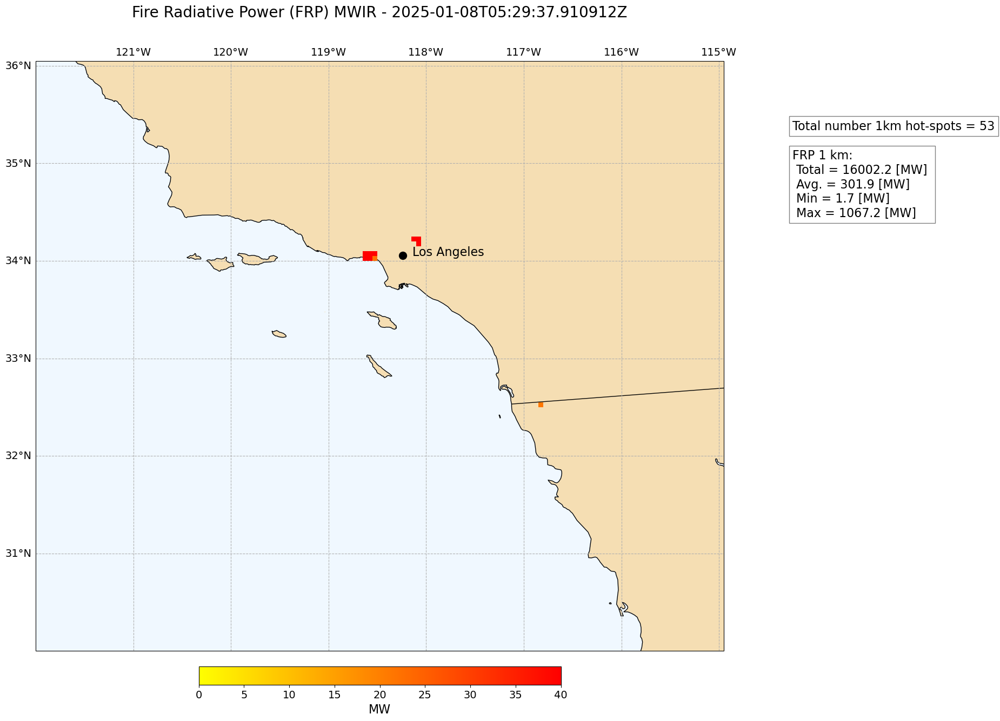

In [20]:
long_name = f'Fire Radiative Power (FRP) MWIR - {time}'
unit = frp_mwir.units
vmax = FRP_plot_max_grid
 
visualize_s3_frp(data=D_mwir[:,:],
                 lat=lat_grid, 
                 lon=lon_grid, 
                 unit=unit, 
                 longname=long_name, 
                 textstr_1=textstr_1, 
                 textstr_2=textstr_2, 
                 vmax=FRP_plot_max_grid)

---

<center> <h2> Creating a Timelapse of the Los Angeles Wildfire </center>

## Extracting the Files

In [4]:
import zipfile
import os

# Ordner mit ZIP-Dateien (falls mehrere)
zip_ordner = "/home/jovyan"  # Pfad zu den ZIP-Dateien
entpackter_ordner = "/home/jovyan/Map_Animation"  # Zielordner für die Bilder

# Falls der Ordner nicht existiert, erstelle ihn
os.makedirs(entpackter_ordner, exist_ok=True)

# Entpacke alle ZIP-Dateien im Ordner
for zip_datei in os.listdir(zip_ordner):
    if zip_datei.endswith(".zip"):
        zip_path = os.path.join(zip_ordner, zip_datei)
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(entpackter_ordner)

print("Alle ZIP-Dateien entpackt!")


Alle ZIP-Dateien entpackt!


## Define a Folder Path Pattern

In [18]:
import glob
 
# Define the folder path pattern
folder_pattern = "/home/jovyan/Map_Animation/*003.SEN3/FRP_MWIR1km_standard.nc"
 
# Get a list of all matching files
nc_files = glob.glob(folder_pattern)
 
# Print the results
print(nc_files)

['/home/jovyan/Map_Animation/S3A_SL_2_FRP____20250109T172339_20250109T172839_20250109T191709_0299_121_169______MAR_O_NR_003.SEN3/FRP_MWIR1km_standard.nc', '/home/jovyan/Map_Animation/S3A_SL_2_FRP____20250108T174932_20250108T175432_20250108T194437_0299_121_155______MAR_O_NR_003.SEN3/FRP_MWIR1km_standard.nc', '/home/jovyan/Map_Animation/S3A_SL_2_FRP____20250111T181145_20250111T181645_20250111T200525_0299_121_198______MAR_O_NR_003.SEN3/FRP_MWIR1km_standard.nc', '/home/jovyan/Map_Animation/S3A_SL_2_FRP____20250107T055612_20250107T060112_20250107T082359_0299_121_134______MAR_O_NR_003.SEN3/FRP_MWIR1km_standard.nc', '/home/jovyan/Map_Animation/S3B_SL_2_FRP____20250110T053937_20250110T054437_20250110T080627_0299_102_034______MAR_O_NR_003.SEN3/FRP_MWIR1km_standard.nc', '/home/jovyan/Map_Animation/S3A_SL_2_FRP____20250111T055226_20250111T055726_20250111T081928_0299_121_191______MAR_O_NR_003.SEN3/FRP_MWIR1km_standard.nc', '/home/jovyan/Map_Animation/S3A_SL_2_FRP____20250113T171959_20250113T172459

In [119]:
test = [nc_files[0]]

## All Previous Steps in One Cell

In [20]:
sampling_lat_FRP_grid = 0.05        # Sampling for gridded FRP values & differenrce  stats computation 
sampling_lon_FRP_grid = 0.05        # Sampling for gridded FRP values & differenrce  stats computation 
FRP_plot_max_grid     = 40.         # Max Integrated FRP value, for plots


lat_min               = 30.        # Minimum latitude for mapping plot [deg N]
lat_max               = 36.        # Maximum latitude for mapping plot [deg N]
lon_min               = -122.        # Minimum lonitude for mapping plot [deg E]
lon_max               = -115.        # Maximum lonitude for mapping plot [deg E]

for frp_dataset in nc_files:
    
    frp_xr =  xr.open_dataset(frp_dataset)
    time=frp_xr.attrs["start_time"]

    lat_frp = frp_xr['latitude']
    lat_frp

    lon_frp = frp_xr['longitude']
    lat_frp
    
    frp_mwir = frp_xr['FRP_MWIR']
    frp_mwir
    
    masked_frp_mwir = generate_masked_array(xarray=frp_mwir, 
                            mask=frp_mwir, 
                            threshold=-1.,
                            operator='!=', drop=True)
    
    
    n_fire_tot           = len(lat_frp[:])
    n_fire_MWIR          = len(masked_frp_mwir.to_masked_array().compressed())
    
    
    
    FRP_MWIR_grid, lat_grid, lon_grid = slstr_frp_gridding(parameter_array=frp_mwir,
                                           parameter='mwir',
                                           lat_min=lat_min, 
                                           lat_max=lat_max, 
                                           lon_min=lon_min, 
                                           lon_max=lon_max, 
                                           sampling_lat_FRP_grid=sampling_lat_FRP_grid,
                                           sampling_lon_FRP_grid=sampling_lon_FRP_grid, 
                                           n_fire=n_fire_MWIR,
                                           lat_frp=lat_frp,
                                           lon_frp=lon_frp)
    
    
    
    mask_valid = np.where(FRP_MWIR_grid[:,:] != -9999., False, True)
    D_mwir = np.ma.masked_array(FRP_MWIR_grid[:,:], mask=mask_valid)
    
    long_name = f'Fire Radiative Power (FRP) MWIR - {time}'
    unit = frp_mwir.units
    vmax = FRP_plot_max_grid
    dir_path = 'frames'
    frame_path = f'{dir_path}/{time}.png'
    # Check if the directory exists, and create it if it doesn't
    if not os.path.exists(dir_path):
        os.makedirs(dir_path) 
        
    save_s3_frp_plot(data=D_mwir[:,:],
                     lat=lat_grid, 
                     lon=lon_grid, 
                     unit=unit, 
                     longname=long_name, 
                     vmax=FRP_plot_max_grid, filename=frame_path)
    
    

## Creating the Timelapse

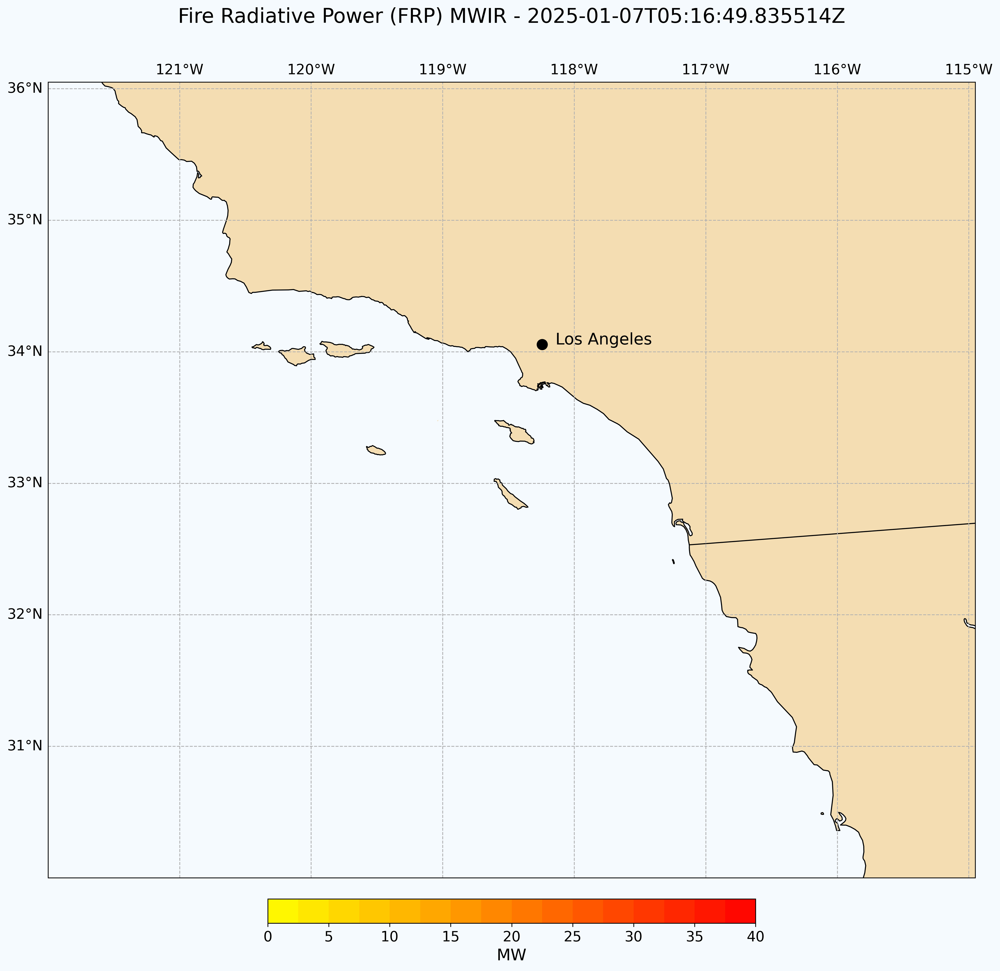

In [1]:
import os
import imageio.v2 as imageio
from PIL import Image

# Ordner mit den Bildern
folder_path = "frames"

# Liste der PNG-Dateien sortieren
images = sorted([img for img in os.listdir(folder_path) if img.endswith(".png")])

# Zielgröße festlegen (Größe des ersten Bildes)
first_image = Image.open(os.path.join(folder_path, images[0]))
target_size = first_image.size  # (Breite, Höhe)

# Lade die Bilder und passe die Größe an
frames = []
for img in images:
    image = Image.open(os.path.join(folder_path, img))
    image = image.resize(target_size)  # Größe anpassen
    frames.append(image)

# Speichere als GIF
frames[0].save("animation.gif", save_all=True, append_images=frames[1:], duration=250, loop=0)

from IPython.display import Image
Image(filename="animation.gif")

---

## Ressources:

RGB: https://github.com/wekeo/learn-olci/blob/6d59ac66b8b6d3e4a9a9a25aa3c1fb0b61b02719/1_OLCI_introductory/1_4_OLCI_bands_imagery.ipynb

FRP: https://gitlab.eumetsat.int/eumetlab/atmosphere/atmosphere/-/blob/master/30_case_studies/315_fire_california_2020_Sentinel-3_SLSTR_NRT_FRP_L2.ipynb